# This script handles S2 band and chm normalization

## Imports

In [2]:
import os
import re
import subprocess
from collections import defaultdict
import numpy as np
import rasterio
from rasterio.merge import merge
from rasterio.warp import reproject, Resampling
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import glob
import json
from tqdm import tqdm

#import geopandas as gpd
import pandas as pd

%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')

import utils.basics as bsc 
import utils.plotting as pt
import utils.processing as proc

## load the data

In [3]:
from types import SimpleNamespace

# PATH - Definitions
# === INPUT Paths ===

PATH_SITE1 = '../data/01_input_pipeline/01_Ebrach' 
PATH_SITE2 = '../data/01_input_pipeline/02_Wald'
PATH_SITE3 = '../data/01_input_pipeline/03_Berch'

PATH_SITE1F = '../data/01_input_pipeline/01_Ebrach/01_' 
PATH_SITE2F = '../data/01_input_pipeline/02_Wald/02_'
PATH_SITE3F = '../data/01_input_pipeline/03_Berch/03_'

CHM_SUFFIX = 'CHM.tif'  # 'ALS_GT' or 'ALS_GT_Processed'
DEM_SUFFIX = 'DEM10.tif'  # 'DEM' or 'DEM_Processed'
DLT_SUFFIX = 'DLT_P.tif'  # 'DLTM' or 'DLTM_Processed'
FMASK_SUFFIX = 'FMA_P.tif'  # 'ForestMask' or 'ForestMask_Processed'

# Define the seasons
SEASONS = ['spring', 'summer', 'autumn']

# Build paths to stacked S2 images for each season for each site
S2_STACKED_PATHS = {
    site: {
        season: os.path.join(site, 'S2', season, 'S2_stacked.tif')
        for season in SEASONS
    }
    for site in [PATH_SITE1, PATH_SITE2, PATH_SITE3]
}

# NAMESPACE FOR EASY HANDLING:

SITE1 = SimpleNamespace(
    NAME="Ebrach",
    PATH=PATH_SITE1,
    PATHF=PATH_SITE1F,
    CHM=os.path.join(PATH_SITE1F + CHM_SUFFIX),
    DEM=os.path.join(PATH_SITE1F + DEM_SUFFIX),
    DLT=os.path.join(PATH_SITE1F + DLT_SUFFIX),
    FMASK=os.path.join(PATH_SITE1F + FMASK_SUFFIX),
    S2=SimpleNamespace(**S2_STACKED_PATHS[PATH_SITE1])
)

SITE2 = SimpleNamespace(
    NAME="Waldbrunn",
    PATH=PATH_SITE2,
    PATHF=PATH_SITE2F,
    CHM=os.path.join(PATH_SITE2F + CHM_SUFFIX),
    DEM=os.path.join(PATH_SITE2F + DEM_SUFFIX),
    DLT=os.path.join(PATH_SITE2F + DLT_SUFFIX),
    FMASK=os.path.join(PATH_SITE2F + FMASK_SUFFIX),
    S2=SimpleNamespace(**S2_STACKED_PATHS[PATH_SITE2])
)

SITE3 = SimpleNamespace(
    NAME="Berchtesgaden",
    PATH=PATH_SITE3,
    PATHF=PATH_SITE3F,
    CHM=os.path.join(PATH_SITE3F + CHM_SUFFIX),
    DEM=os.path.join(PATH_SITE3F + DEM_SUFFIX),
    DLT=os.path.join(PATH_SITE3F + DLT_SUFFIX),
    FMASK=os.path.join(PATH_SITE3F + FMASK_SUFFIX),
    S2=SimpleNamespace(**S2_STACKED_PATHS[PATH_SITE3])
)


In [82]:
# this is how our namespace looks like, we'll add the S2_norm later.
SITE1

namespace(NAME='Ebrach',
          PATH='../data/01_input_pipeline/01_Ebrach',
          PATHF='../data/01_input_pipeline/01_Ebrach/01_',
          CHM='../data/01_input_pipeline/01_Ebrach/01_CHM.tif',
          DEM='../data/01_input_pipeline/01_Ebrach/01_DEM10.tif',
          DLT='../data/01_input_pipeline/01_Ebrach/01_DLT_P.tif',
          FMASK='../data/01_input_pipeline/01_Ebrach/01_FMA_P.tif',
          S2=namespace(spring='../data/01_input_pipeline/01_Ebrach/S2/spring/S2_stacked.tif',
                       summer='../data/01_input_pipeline/01_Ebrach/S2/summer/S2_stacked.tif',
                       autumn='../data/01_input_pipeline/01_Ebrach/S2/autumn/S2_stacked.tif'))

In [4]:
# Load S2 and merged ALS data for both sites and combine them in an array
s2_np1, als_np1, band_names = bsc.load_rasters(SITE1.S2.spring, SITE1.CHM, verbose=False)
s2_np2, als_np2, band_names = bsc.load_rasters(SITE2.S2.spring, SITE2.CHM, verbose=False)
s2_np3, als_np3, band_names = bsc.load_rasters(SITE3.S2.spring, SITE3.CHM, verbose=False)

## plot the S2 channel histograms

,B1_BLU_Q50,B2_BNR_Q50,B3_EVI_Q50,B4_GRN_Q50,B5_NBR_Q50,B6_NDV_Q50,B7_NIR_Q50,B8_RE1_Q50,B9_RE2_Q50,B10_RE3_Q50,B11_RED_Q50,B12_SW1_Q50,B13_SW2_Q50
P0,40.0,457.00,-8472.00,220.0,-1723.0,-2097.0,631.0,428.00,564.0,589.0,147.0,561.00,265.0
P0.1,170.0,1218.00,605.00,311.0,-441.0,727.0,1401.0,519.00,1227.0,1322.0,183.0,934.00,406.0
P25,253.0,2822.00,4874.00,545.0,5354.0,7262.0,3013.0,931.00,2343.0,2731.0,290.0,1505.00,695.0
P50,288.0,3244.00,5645.00,620.0,6227.0,8089.0,3392.0,1035.00,2602.0,3100.0,347.0,1648.00,785.0
P75,411.0,3706.00,6244.00,757.0,6688.0,8435.0,3806.0,1189.00,2893.0,3527.0,548.0,1847.00,970.0
P95,792.0,4783.00,7379.00,1207.0,7685.0,8813.0,4822.0,1706.00,3673.0,4590.0,1326.0,2446.00,1842.0
P99.9,1896.0,6027.37,9249.37,2234.0,8255.0,9199.0,6041.0,2657.74,4745.0,5805.0,2531.0,3581.37,3065.0
P100,6416.0,7145.00,13379.00,6494.0,8491.0,9307.0,7075.0,6624.00,6868.0,6785.0,6564.0,5322.00,5278.0
NaN Ratio,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0


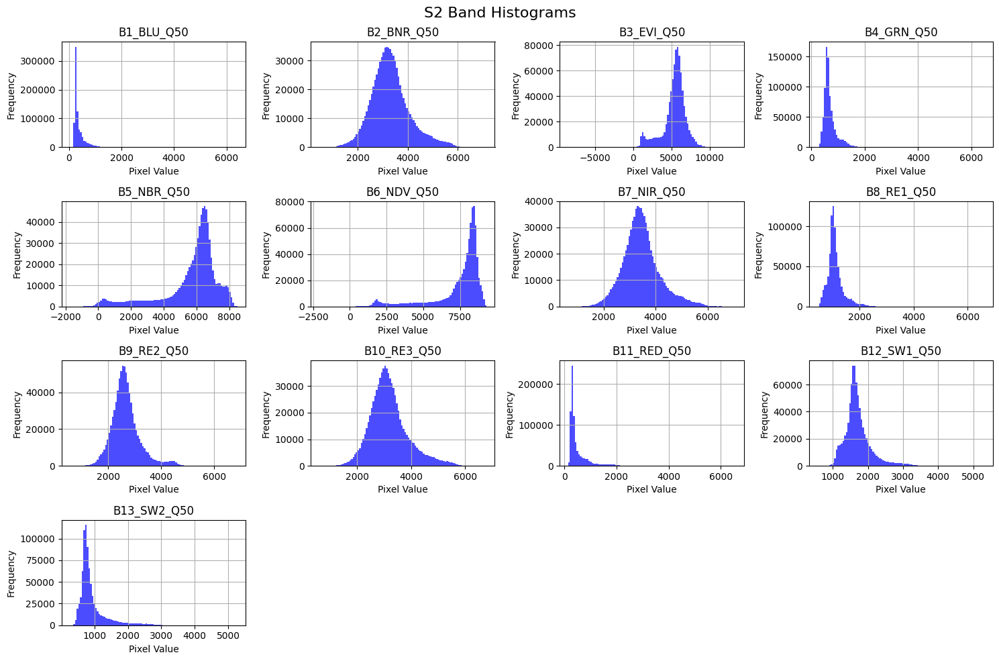

In [90]:
pt.plot_s2_histograms_and_percentiles(s2_np2, num_bands=13, band_names=band_names)

⚡️ we observe: many missing values (-9999.0) and real values are just within a small range. --> we need to normalize! 

## Normalize S2 channels

In [23]:
# takes around 50sec to normalize everything:
for site in tqdm([SITE1, SITE2, SITE3], desc="Sites"):
    for season in SEASONS:
        if hasattr(site.S2, season):
            proc.normalize_and_save_s2_geotiff(getattr(site.S2, season), site, season, override=False)


Sites: 100%|██████████| 3/3 [00:00<00:00, 2487.23it/s]

✅ Normalized file already exists: ../data/01_input_pipeline/01_Ebrach/S2/spring/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/01_Ebrach/S2/summer/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/01_Ebrach/S2/autumn/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/02_Wald/S2/spring/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/02_Wald/S2/summer/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/02_Wald/S2/autumn/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/03_Berch/S2/spring/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_input_pipeline/03_Berch/S2/summer/S2_stacked_norm.tif. Namespace updated.
✅ Normalized file already exists: ../data/01_inp

In [69]:
s2_1n, desc = bsc.read_multiband_tif_as_stack(SITE2.S2_norm.summer, bands=13, channels=5)

In [70]:
s2_1n.shape
s2_1nr = s2_1n.reshape(13*5,s2_1n.shape[2],s2_1n.shape[3])

In [65]:
s2_1nr.shape

(65, 846, 1241)

## now histograms should look much better.

,B1_BLU_Q25,B2_BLU_Q50,B3_BLU_Q75,B4_BLU_AVG,B5_BLU_STD,B6_BNR_Q25,B7_BNR_Q50,B8_BNR_Q75,B9_BNR_AVG,B10_BNR_STD,B11_EVI_Q25,B12_EVI_Q50,B13_EVI_Q75,B14_EVI_AVG,B15_EVI_STD,B16_GRN_Q25
P0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P0.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P25,0.05,0.05,0.08,0.06,0.11,0.32,0.34,0.36,0.34,0.09,0.26,0.29,0.41,0.32,0.06,0.09
P50,0.10,0.09,0.13,0.10,0.17,0.41,0.43,0.45,0.43,0.13,0.59,0.62,0.62,0.61,0.10,0.15
P75,0.26,0.31,0.33,0.31,0.28,0.50,0.52,0.53,0.52,0.19,0.68,0.69,0.68,0.69,0.19,0.34
P95,0.42,0.50,0.51,0.46,0.61,0.64,0.68,0.71,0.67,0.41,0.76,0.78,0.79,0.78,0.56,0.51
P99.9,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
P100,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
NaN Ratio,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


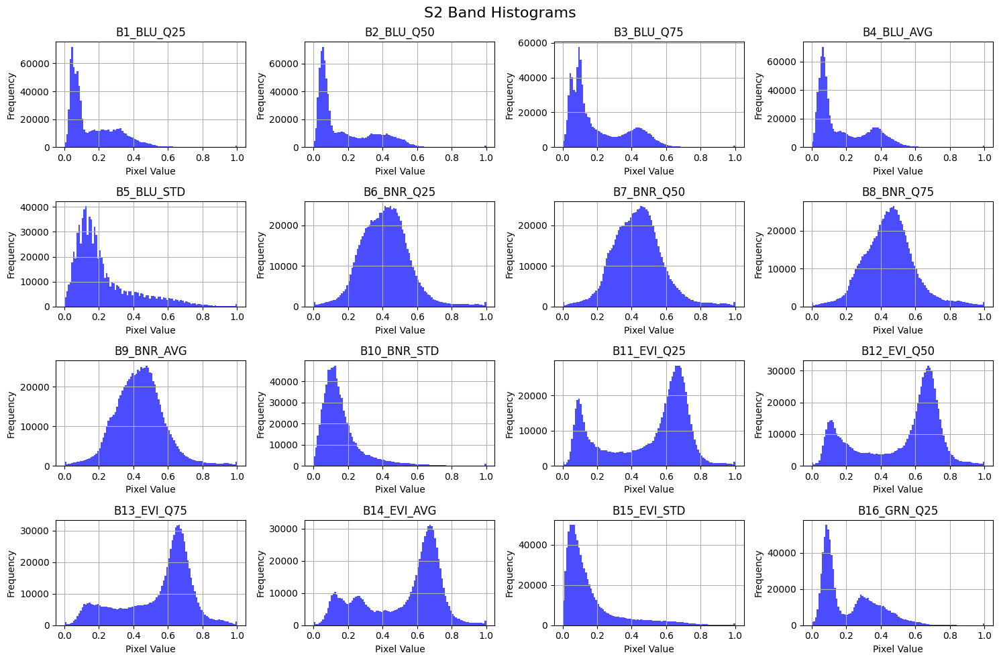

In [71]:
pt.plot_s2_histograms_and_percentiles(s2_1nr, num_bands=16, band_names=desc)

# TO-DO: cleanup RGB channels vizualizations

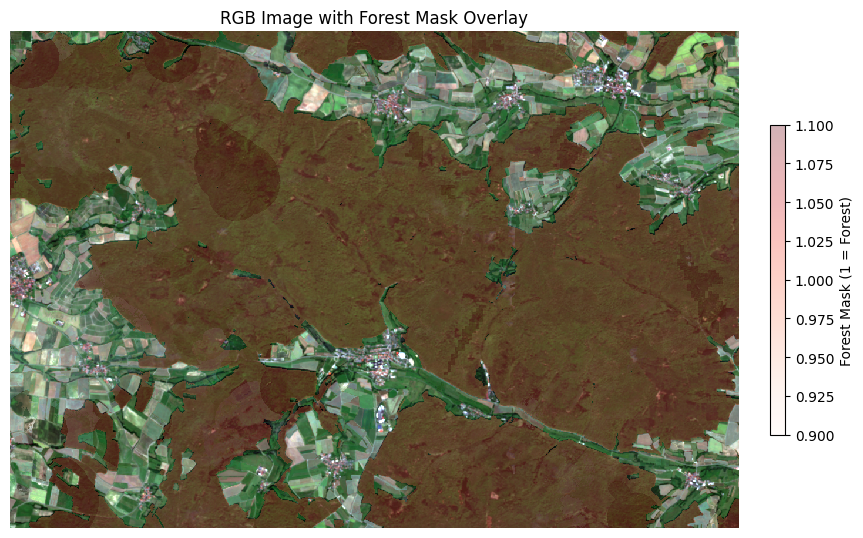

In [ ]:
pt.plot_overlay(s2_1n[:,1,:,:], fmask1, alpha=0.3, type="FMASK")

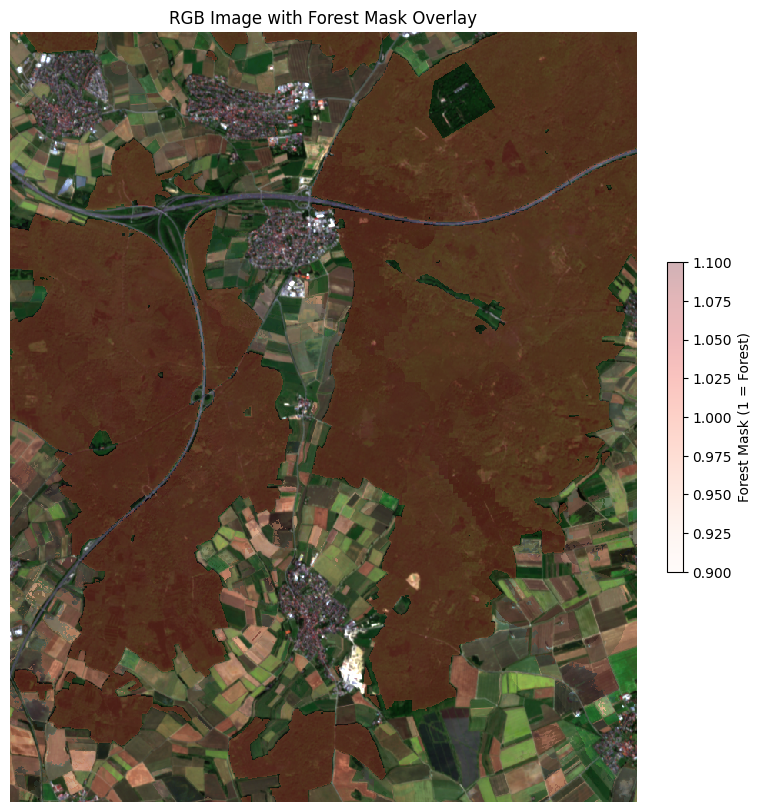

In [231]:
pt.plot_overlay(s2_2n[:,1,:,:], fmask2, alpha=0.3, type="FMASK")

## plot the channels of S2 aggregation

Channel 1: Q25
  Shape: (13, 1002, 815)


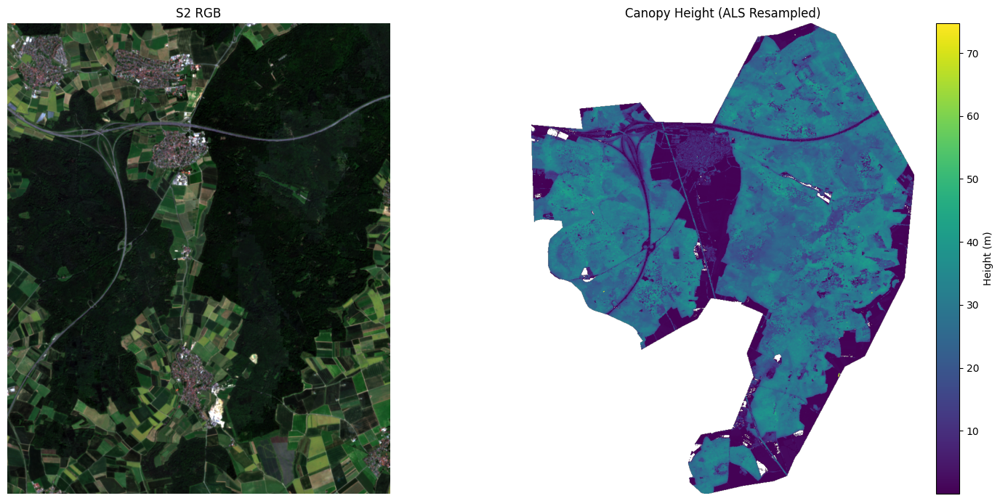

Channel 2: Q50
  Shape: (13, 1002, 815)


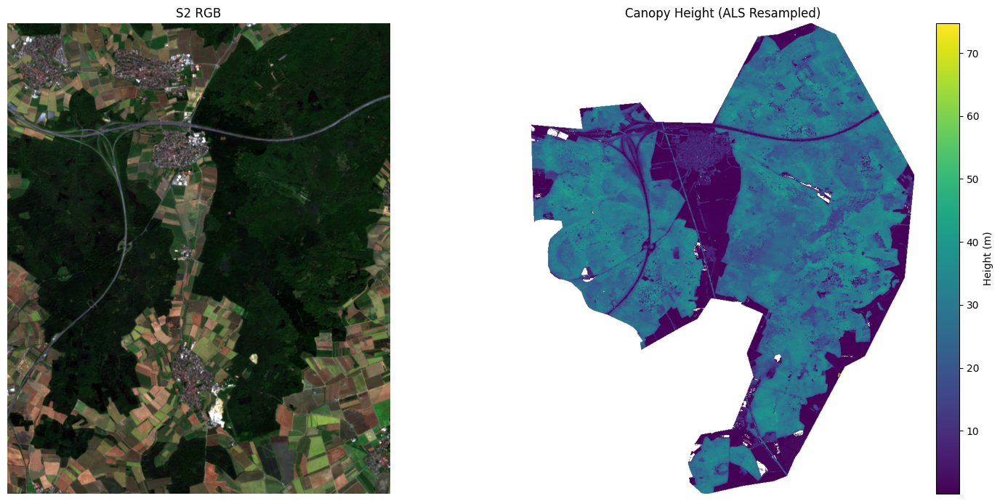

Channel 3: Q75
  Shape: (13, 1002, 815)


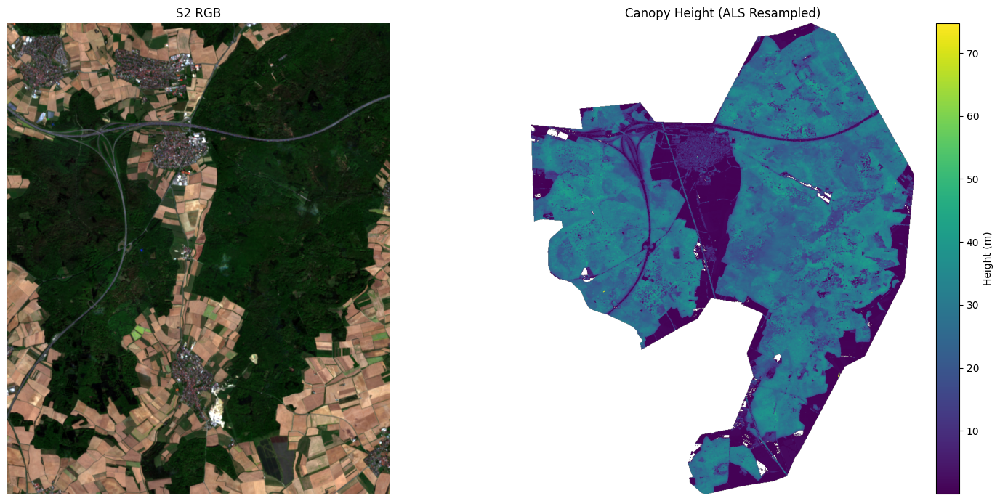

Channel 4: AVG
  Shape: (13, 1002, 815)


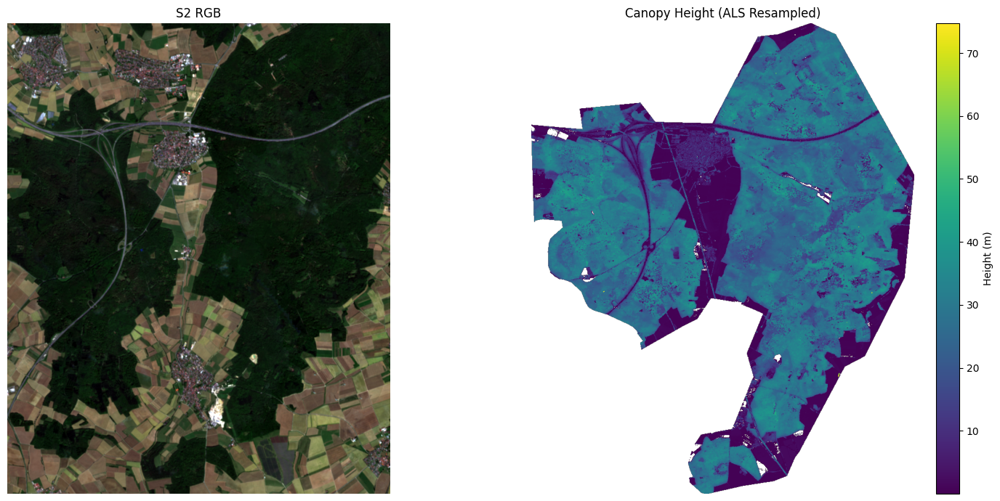

Channel 5: STD
  Shape: (13, 1002, 815)


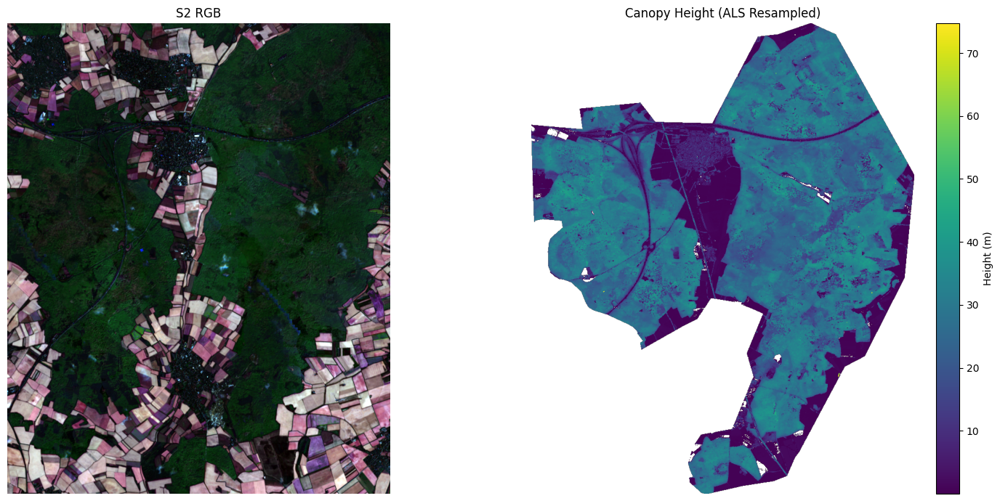

In [237]:
for i in range(s2_2n.shape[1]):
    print(f"Channel {i+1}: {band_names[i][-3:]}")
    s2_temp = s2_2n[:,i, :, :]
    print(f"  Shape: {s2_temp.shape}")
    pt.plot_full_image(s2_temp, als_np2)

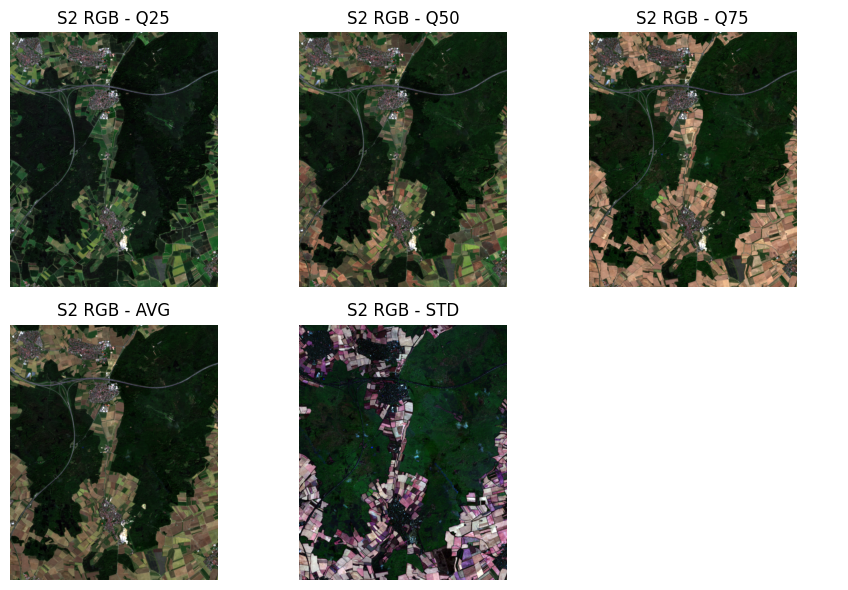

In [245]:
def plot_s2_rgb(s2_data, band_indices=(10, 3, 0), band_names=None, title_prefix="S2 RGB"):
    """
    Plots the RGB composite for each channel in the second dimension of s2_data.

    Parameters:
    - s2_data: numpy array of shape (bands, channels, height, width)
    - band_indices: tuple of indices for (R, G, B) bands
    - band_names: list or tuple of band names (optional)
    - title_prefix: prefix for plot titles
    """
    num_channels = s2_data.shape[1]
    # For 5 subplots, a 2x3 grid (2 rows, 3 columns) looks good
    nrows, ncols = 2, 3
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.array(axes).reshape(nrows, ncols)
    for i in range(num_channels):
        row, col = divmod(i, ncols)
        rgb = np.stack([
            s2_data[band_indices[0], i, :, :],
            s2_data[band_indices[1], i, :, :],
            s2_data[band_indices[2], i, :, :]
        ], axis=-1)
        ax = axes[row, col]
        ax.imshow(np.clip(rgb, 0, 1))
        if band_names:
            ax.set_title(f"{title_prefix} - {band_names[i][-3:]}")
        else:
            ax.set_title(f"{title_prefix} - Channel {i+1}")
        ax.axis('off')
    # Hide any unused subplots
    for j in range(num_channels, nrows * ncols):
        row, col = divmod(j, ncols)
        axes[row, col].axis('off')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_s2_rgb(s2_2n, band_indices=(10, 3, 0), band_names=band_names)

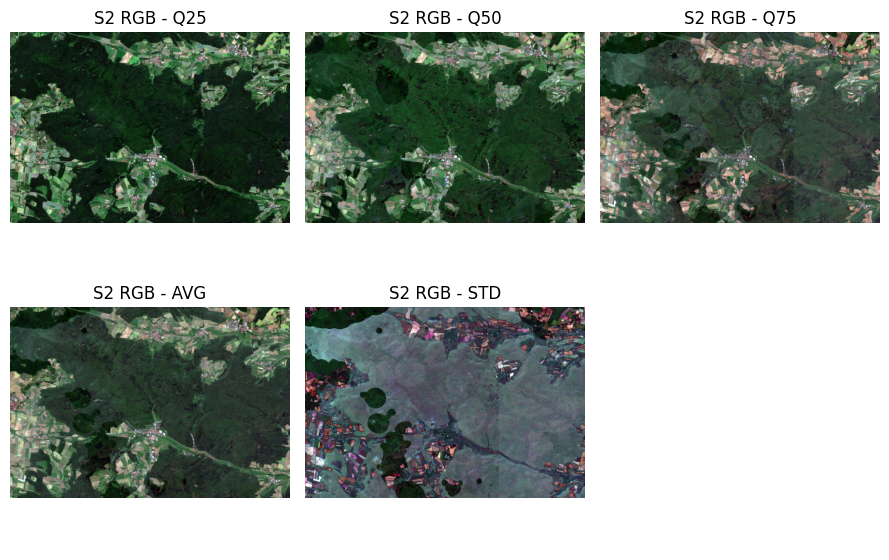

In [246]:
plot_s2_rgb(s2_1n, band_indices=(10, 3, 0), band_names=band_names)

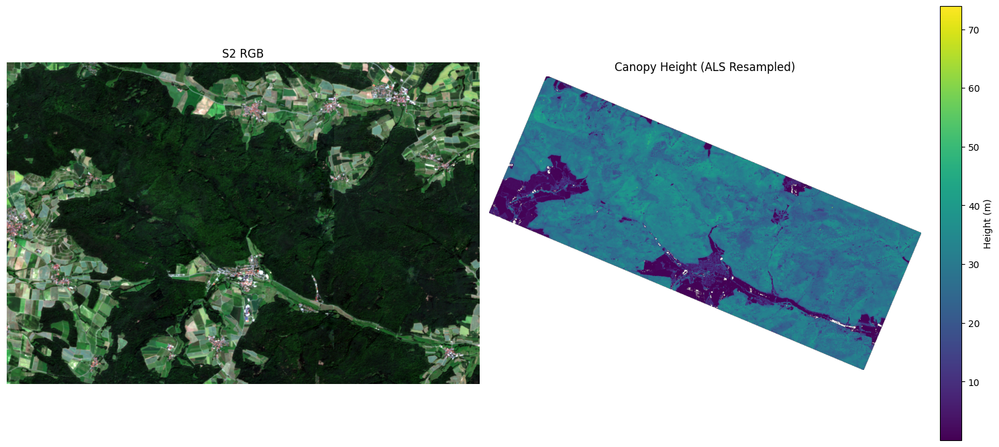

In [145]:
pt.plot_full_image(s2_1n, als_np)

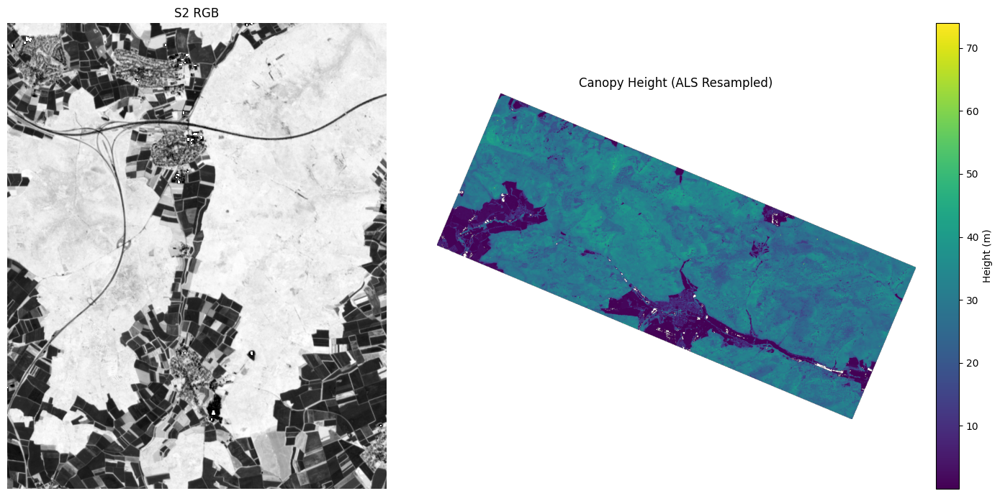

In [208]:
pt.plot_full_image(s2_2n[:,0,:,:], als_np, band_idxs=(5,5,5),norm_rgb=False)

Channel 1: Q25
  Shape: (13, 846, 1241)


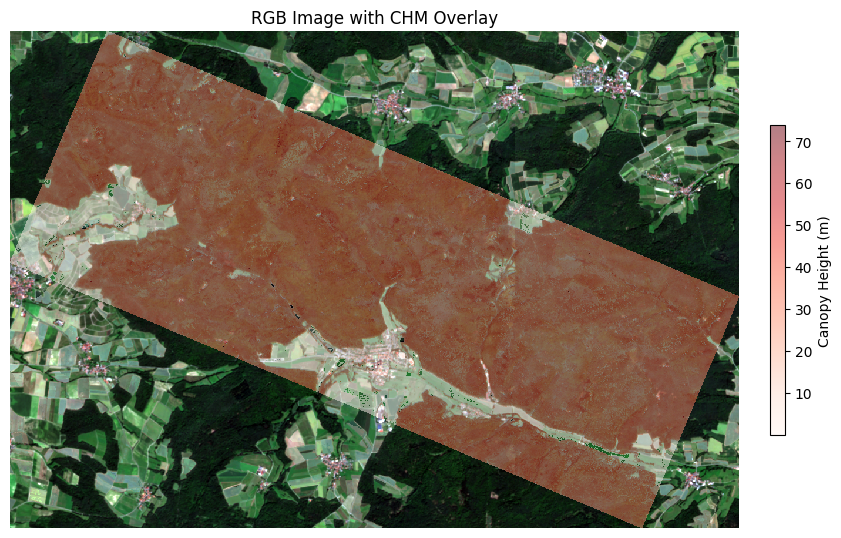

Channel 2: Q50
  Shape: (13, 846, 1241)


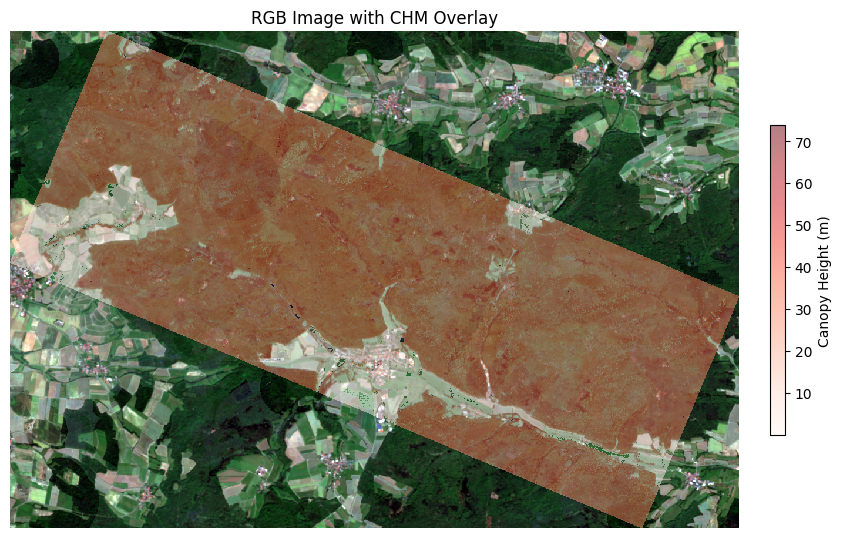

Channel 3: Q75
  Shape: (13, 846, 1241)


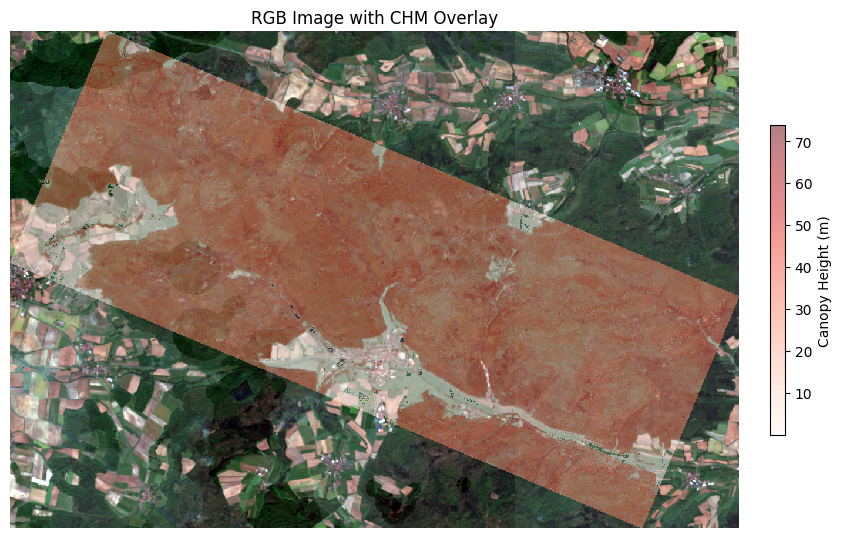

Channel 4: AVG
  Shape: (13, 846, 1241)


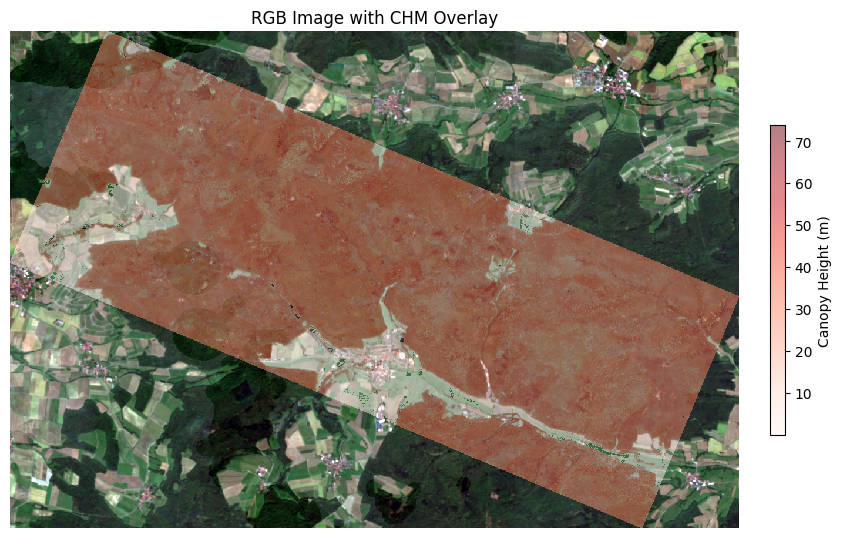

Channel 5: STD
  Shape: (13, 846, 1241)


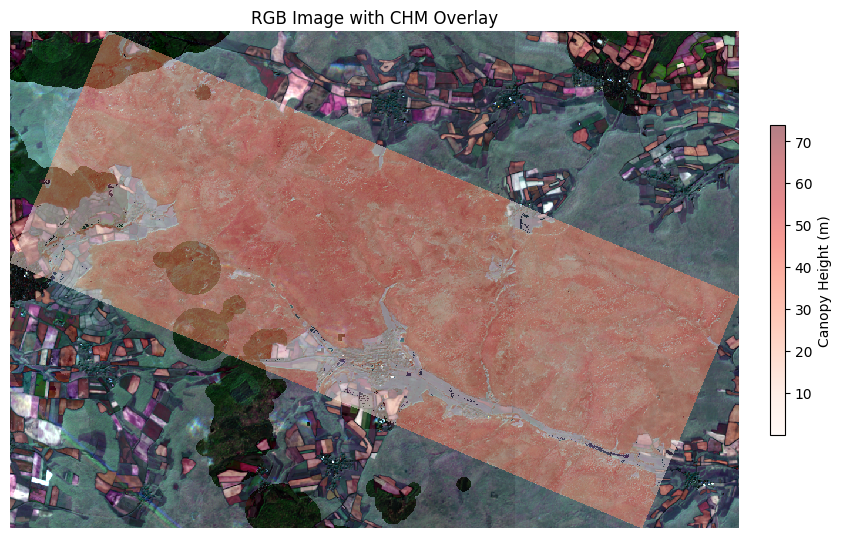

In [187]:
for i in range(s2_1n.shape[1]):
    print(f"Channel {i+1}: {band_names[i][-3:]}")
    s2_temp = s2_1n[:,i, :, :]
    print(f"  Shape: {s2_temp.shape}")
    pt.plot_overlay(s2_temp, als_np)

now we're set.

# ALS Normalization

In [5]:
fmask1 = bsc.read_tif_as_array(SITE1.FMASK)
fmask2 = bsc.read_tif_as_array(SITE2.FMASK)
fmask3 = bsc.read_tif_as_array(SITE3.FMASK)
chm3 = bsc.read_tif_as_array(SITE3.CHM)

✅ Loaded 01_FMA_P.tif: shape=(846, 1241), CRS=EPSG:25832, GSD=10.00 x 9.99 metre
Band names: (None,)
✅ Loaded 02_FMA_P.tif: shape=(1002, 815), CRS=EPSG:25832, GSD=9.99 x 10.00 metre
Band names: (None,)
✅ Loaded 03_FMA_P.tif: shape=(1870, 2129), CRS=EPSG:25832, GSD=10.00 x 10.00 metre
Band names: (None,)
✅ Loaded 03_CHM.tif: shape=(1870, 2129), CRS=EPSG:25832, GSD=10.00 x 10.00 metre
Band names: (None,)


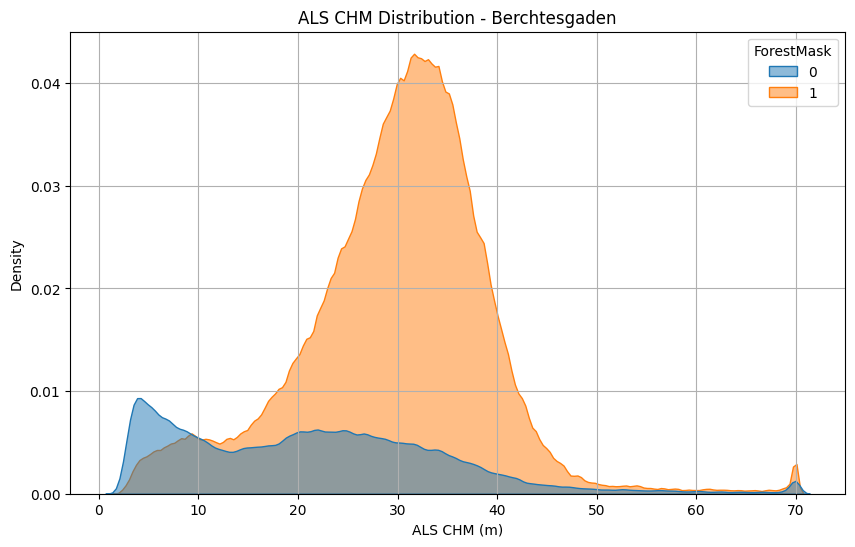

Some statistics for Berchtesgaden:
Forest Mask: 			78.48% Forest
Share of ALS CHM > 2m: 		100.00%


In [88]:
pt.plot_als_distribution_byfmask(als_np3, fmask3, SITE3.NAME)

In [ ]:
# DO NORMALIZATION OF ALS WHERE FOREST MASK IS 1
NORMPARAMS = proc.compute_chm_norm_params(SITE1, SITE2, SITE3)

In [9]:
NORMPARAMS.info

namespace(description='CHM normalization parameters',
          encoding='001: FirstSite only, 010: Second Site, 100: Third Site',
          version='1.0')

In [18]:
NORMPARAMS.chm

namespace(_001={'mu': 29.136810302734375,
                'std': 5.059322357177734,
                'n': 424127},
          _010={'mu': 27.330501556396484,
                'std': 6.319409370422363,
                'n': 331027},
          _100={'mu': 29.6536808013916, 'std': 9.09404182434082, 'n': 752512},
          _011={'mu': 28.23365592956543,
                'std': 5.794953346252441,
                'n': 755154},
          _101={'mu': 29.395244598388672,
                'std': 7.363151550292969,
                'n': 1176639},
          _110={'mu': 28.49209213256836,
                'std': 7.916279315948486,
                'n': 1083539},
          _111={'mu': 28.706998825073242,
                'std': 7.0994954109191895,
                'n': 1507666},
          _eq={'mu': 28.706998825073242,
               'std': 7.0994954109191895,
               'n': 1507666})

In [19]:
import yaml

def namespace_to_dict(ns):
    if isinstance(ns, SimpleNamespace):
        return {k: namespace_to_dict(v) for k, v in ns.__dict__.items()}
    elif isinstance(ns, dict):
        return {k: namespace_to_dict(v) for k, v in ns.items()}
    elif isinstance(ns, np.ndarray):
        return ns.tolist()
    elif hasattr(ns, '__dict__'):
        return {k: namespace_to_dict(v) for k, v in ns.__dict__.items()}
    else:
        return ns

normparams_dict = namespace_to_dict(NORMPARAMS)

with open('../configs/normparams.yaml', 'w') as f:
    yaml.dump(normparams_dict, f)

In [20]:
proc.normalize_chm(SITE1,SITE2,SITE3,NORMPARAMS, jointnorm=True)

In [47]:
proc.normalize_chm(SITE1,SITE2,SITE3,NORMPARAMS, jointnorm=False)

✅ Saved normalized CHM for combo 001 at ../data/01_input_pipeline/10_generalization/Ebrach/CHM_norm001.tif
✅ Saved normalized CHM for combo 001 at ../data/01_input_pipeline/10_generalization/Waldbrunn/CHM_norm001.tif
✅ Saved normalized CHM for combo 001 at ../data/01_input_pipeline/10_generalization/Berchtesgaden/CHM_norm001.tif
✅ Saved normalized CHM for combo 010 at ../data/01_input_pipeline/10_generalization/Ebrach/CHM_norm010.tif
✅ Saved normalized CHM for combo 010 at ../data/01_input_pipeline/10_generalization/Waldbrunn/CHM_norm010.tif
✅ Saved normalized CHM for combo 010 at ../data/01_input_pipeline/10_generalization/Berchtesgaden/CHM_norm010.tif
✅ Saved normalized CHM for combo 100 at ../data/01_input_pipeline/10_generalization/Ebrach/CHM_norm100.tif
✅ Saved normalized CHM for combo 100 at ../data/01_input_pipeline/10_generalization/Waldbrunn/CHM_norm100.tif
✅ Saved normalized CHM for combo 100 at ../data/01_input_pipeline/10_generalization/Berchtesgaden/CHM_norm100.tif
✅ Saved

In [46]:
NORMPARAMS.chm

namespace(_001={'mu': 29.136810302734375,
                'std': 5.059322357177734,
                'n': 424127},
          _010={'mu': 27.330501556396484,
                'std': 6.319409370422363,
                'n': 331027},
          _100={'mu': 29.6536808013916, 'std': 9.09404182434082, 'n': 752512},
          _011={'mu': 28.23365592956543,
                'std': 5.794953346252441,
                'n': 755154},
          _101={'mu': 29.395244598388672,
                'std': 7.363151550292969,
                'n': 1176639},
          _110={'mu': 28.49209213256836,
                'std': 7.916279315948486,
                'n': 1083539},
          _111={'mu': 28.706998825073242,
                'std': 7.0994954109191895,
                'n': 1507666},
          _eq={'mu': 28.706998825073242,
               'std': 7.0994954109191895,
               'n': 1507666})

In [32]:
os.path.splitext(site.CHM)[0]

'../data/01_input_pipeline/03_Berch/03_CHM'

In [48]:
chm1 = bsc.read_tif_as_array(SITE1.CHM_norm)
chm2 = bsc.read_tif_as_array(SITE2.CHM_norm)
chm3 = bsc.read_tif_as_array(SITE3.CHM_norm)

✅ Loaded 01_CHM_norm111.tif: shape=(846, 1241), CRS=EPSG:25832, GSD=10.00 x 9.99 metre
Band names: ('nCHM_global',)
✅ Loaded 02_CHM_norm111.tif: shape=(1002, 815), CRS=EPSG:25832, GSD=9.99 x 10.00 metre
Band names: ('nCHM_global',)
✅ Loaded 03_CHM_norm111.tif: shape=(1870, 2129), CRS=EPSG:25832, GSD=10.00 x 10.00 metre
Band names: ('nCHM_global',)


## update yaml files

In [24]:
from types import SimpleNamespace
import pickle
import yaml

# Group all SITE and NORMPARAMS namespaces into one DATA_DIR namespace
DATA_DIR = SimpleNamespace(
    SITE1=SITE1,
    SITE2=SITE2,
    SITE3=SITE3
    #NORMPARAMS=NORMPARAMS
)

# Save DATA_DIR namespace to a file using pickle
with open('DATA_DIR.pkl', 'wb') as f:
    pickle.dump(DATA_DIR, f)

    # Convert DATA_DIR to a serializable dict
    def namespace_to_dict(ns):
        if isinstance(ns, SimpleNamespace):
            return {k: namespace_to_dict(v) for k, v in ns.__dict__.items()}
        elif isinstance(ns, dict):
            return {k: namespace_to_dict(v) for k, v in ns.items()}
        elif isinstance(ns, np.ndarray):
            return ns.tolist()
        elif hasattr(ns, '__dict__'):
            return {k: namespace_to_dict(v) for k, v in ns.__dict__.items()}
        else:
            return ns

    data_dir_dict = namespace_to_dict(DATA_DIR)

    # Save as YAML
    with open('../configs/datapaths.yaml', 'w') as f:
        yaml.dump(data_dir_dict, f)

In [28]:
DATA_DIR

namespace(SITE1=namespace(NAME='Ebrach',
                          PATH='../data/01_input_pipeline/01_Ebrach',
                          PATHF='../data/01_input_pipeline/01_Ebrach/01_',
                          CHM='../data/01_input_pipeline/01_Ebrach/01_CHM.tif',
                          DEM='../data/01_input_pipeline/01_Ebrach/01_DEM10.tif',
                          DLT='../data/01_input_pipeline/01_Ebrach/01_DLT_P.tif',
                          FMASK='../data/01_input_pipeline/01_Ebrach/01_FMA_P.tif',
                          S2=namespace(spring='../data/01_input_pipeline/01_Ebrach/S2/spring/S2_stacked.tif',
                                       summer='../data/01_input_pipeline/01_Ebrach/S2/summer/S2_stacked.tif',
                                       autumn='../data/01_input_pipeline/01_Ebrach/S2/autumn/S2_stacked.tif'),
                          CHM_norm='../data/01_input_pipeline/01_Ebrach/01_CHM_norm111.tif',
                          CHM_norm_params={'mu': 28.7069988250

## plot norm distributions

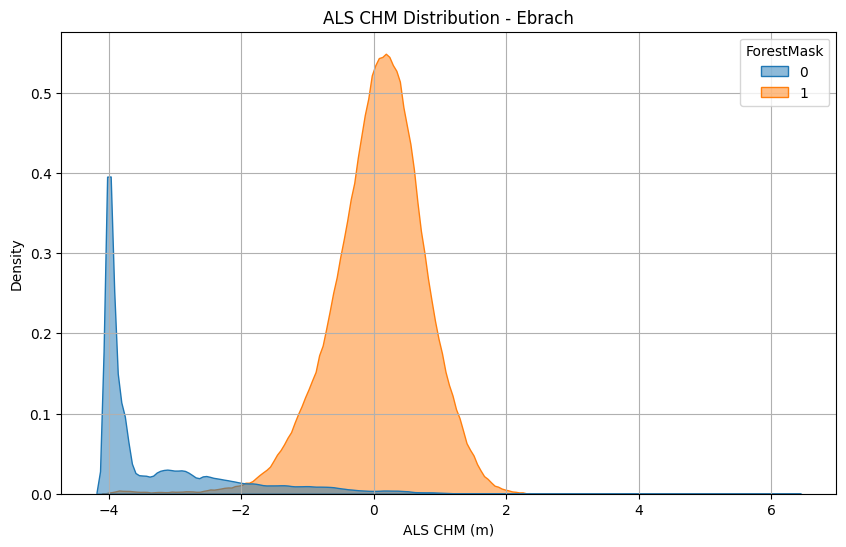

Some statistics for Ebrach:
Forest Mask: 			85.09% Forest
Share of ALS CHM > 2m: 		0.10%


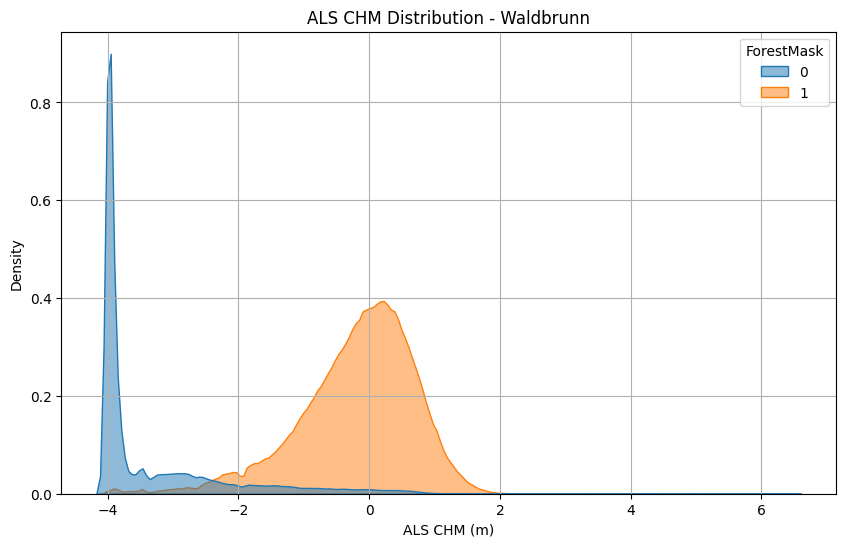

Some statistics for Waldbrunn:
Forest Mask: 			74.55% Forest
Share of ALS CHM > 2m: 		0.05%


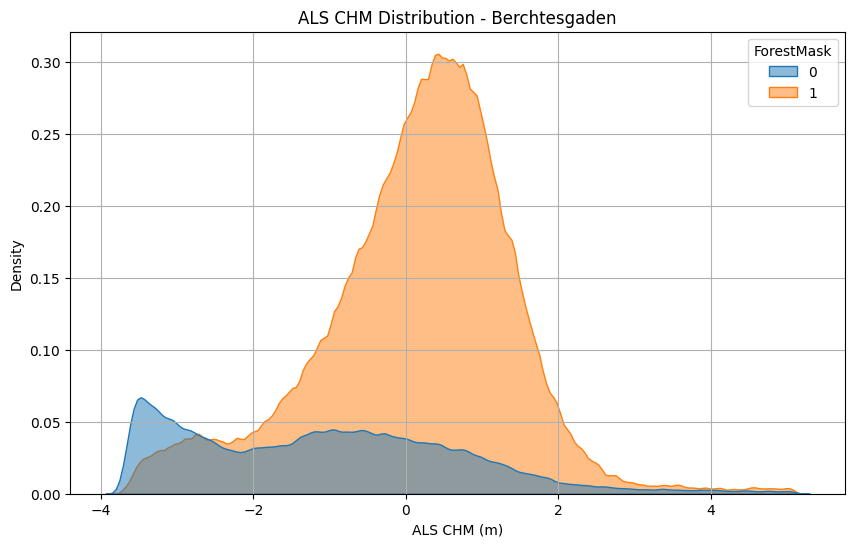

Some statistics for Berchtesgaden:
Forest Mask: 			78.53% Forest
Share of ALS CHM > 2m: 		4.34%


In [27]:
pt.plot_als_distribution_byfmask(chm1, fmask1, SITE1.NAME)
pt.plot_als_distribution_byfmask(chm2, fmask2, SITE2.NAME)
pt.plot_als_distribution_byfmask(chm3, fmask3, SITE3.NAME)